In [18]:
import pandas as pd
from pandas.io.json import json_normalize
import json
import matplotlib.pyplot as plt

# Lecture du fichier Json local 

In [19]:
data_str = open('babyfoot.json').read()

In [20]:
data_list = json.loads(data_str)
df = json_normalize(data_list)

In [21]:
df.head()

,frame,goal,id,nxt_state,nxt_x,nxt_y,position,state,total_goal,vitesse,x,y
0,2019_12_11__17_52_23.mkv__frame0.jpg,0,0,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
1,2019_12_11__17_52_23.mkv__frame1.jpg,0,1,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
2,2019_12_11__17_52_23.mkv__frame2.jpg,0,2,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
3,2019_12_11__17_52_23.mkv__frame3.jpg,0,3,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
4,2019_12_11__17_52_23.mkv__frame4.jpg,0,4,la balle est en jeu,352,88,"[354, 89]",la balle est en jeu,0,0.13,354,89


remarque : la position de balle est entre [x=0,y=0] et [x=450,y=640], si la position de la balle est [x=0,y=0], c'est à dire la balle n'est pas sur le terrain.

# Visualisation de la trajectoire

Cette figure présente les trajectoires de la balle selon leur coordonnées x et y.
L'axe des abscisses représente le temps : le bleu plus clair représente les frames au début et le bleu plus foncé représente les frames à la fin de la vidéo.

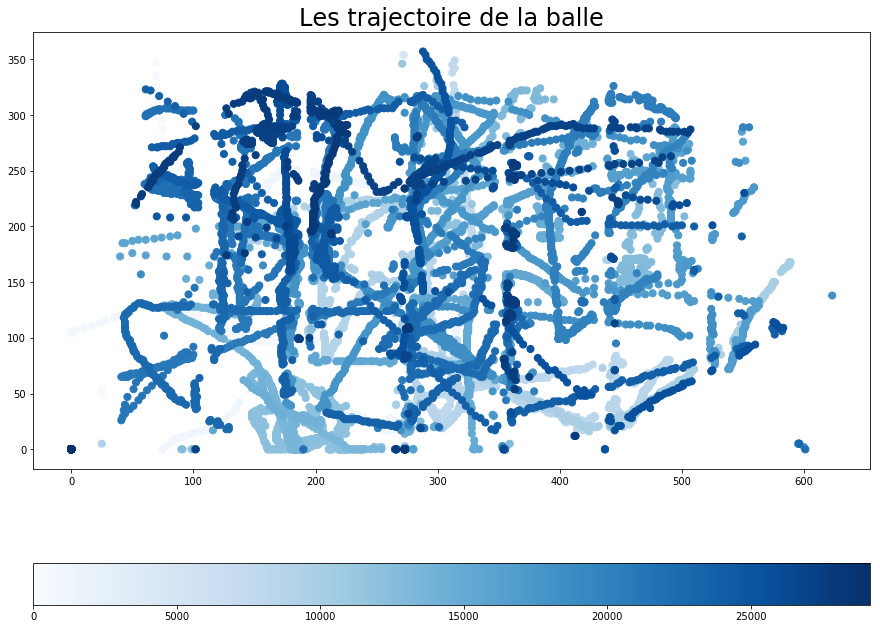

In [25]:
plt.figure(figsize=(15,11.5))
plt.scatter(df['x'],df['y'],c=df.index,
            cmap=plt.cm.Blues, s=50,zorder=1)
cbar =plt.colorbar(orientation="horizontal")
plt.title('Les trajectoire de la balle',fontsize=24)
plt.show()

# Schéma violon 
Analyse statistique des trois statuts de la balle.

In [26]:
import plotly.express as px
fig2 = px.violin(df, y="id", color="state",
                violinmode='overlay',
                 range_y=[0,30000],
                hover_data=df.columns)
fig2.show()

On remarque que : 
- Premières 7,000 frames : le match n'a pas encore commencé, la balle est hors du terrain. 
- Entre la 7,000ème frame et la 25,000ème frame [approximativement] : la balle est en jeu
- Après la 25,000ème frame : le match est fini, la balle est hors du terrain

Supprimer les données quand la balle n'est pas présente sur le terrain

In [27]:
df1=df.loc[df['x']!=0]
df2=df1.loc[df1['y']!=0]
df2

,frame,goal,id,nxt_state,nxt_x,nxt_y,position,state,total_goal,vitesse,x,y
0,2019_12_11__17_52_23.mkv__frame0.jpg,0,0,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
1,2019_12_11__17_52_23.mkv__frame1.jpg,0,1,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
2,2019_12_11__17_52_23.mkv__frame2.jpg,0,2,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
3,2019_12_11__17_52_23.mkv__frame3.jpg,0,3,la balle est en jeu,354,89,"[354, 89]",la balle est en jeu,0,0.00,354,89
4,2019_12_11__17_52_23.mkv__frame4.jpg,0,4,la balle est en jeu,352,88,"[354, 89]",la balle est en jeu,0,0.13,354,89
5,2019_12_11__17_52_23.mkv__frame5.jpg,0,5,la balle est en jeu,355,89,"[352, 88]",la balle est en jeu,0,0.19,352,88
6,2019_12_11__17_52_23.mkv__frame6.jpg,0,6,la balle est en jeu,356,90,"[355, 89]",la balle est en jeu,0,0.08,355,89
7,2019_12_11__17_52_23.mkv__frame7.jpg,0,7,la balle est en jeu,352,90,"[356, 90]",la balle est en jeu,0,0.24,356,90
8,2019_12_11__17_52_23.mkv__frame8.jpg,0,8,la balle est en jeu,192,97,"[352, 90]",la balle est en jeu,0,9.61,352,90
9,2019_12_11__17_52_23.mkv__frame9.jpg,0,9,la balle est en jeu,356,90,"[192, 97]",la balle est en jeu,0,9.85,192,97


# Courbe de la vitesse par identifiant du frame

In [9]:
fig = px.line(df2, x='id', y='vitesse')
fig.show()

On remarque que : 
    - La vitesse de la balle fluctue beaucoup au cours du temps
    - La vitesse maximum atteinte par la balle est : 37.28 m/s

### Combinaison des données à analyser pour les frames qui ont un but

In [28]:
df3=df[['goal','vitesse','total_goal']]
df3=df3.loc[df3['goal']==1]
df3

,goal,vitesse,total_goal
10147,1,0.06,1
10149,1,36.75,2
15784,1,0.63,3
15897,1,0.35,4
15906,1,36.92,5
15942,1,34.53,6
16433,1,37.11,7
16505,1,36.58,8
16553,1,33.73,9
16556,1,0.12,10


In [11]:
len(df3)

41

### Description statistique de la table

In [12]:
df3.describe()

,goal,vitesse,total_goal
count,41.0,41.000000,41.000000
mean,1.0,17.009024,21.000000
std,0.0,16.728792,11.979149
min,1.0,0.000000,1.000000
25%,1.0,0.190000,11.000000
50%,1.0,15.760000,21.000000
75%,1.0,34.880000,31.000000
max,1.0,37.110000,41.000000


# Tendance de la vitesse par identifiant du frame

In [14]:
fig = px.scatter(df3, x="total_goal", y="vitesse", trendline="lowess")
fig.show()

* Chaque point du graphe représente un but.
* La courbe représente la tendance de la vitesse par but